<a href="https://www.kaggle.com/c/tensorflow-great-barrier-reef/">Ссылка</a> на соревнование KAGGLE

# Dowload the competition data

In [ ]:
# Mount google drive
from google.colab import drive
drive.mount('MyDrive')

Mounted at MyDrive


In [ ]:
# updating the Kagggle API module using pip
!pip uninstall -y kaggle
!pip install --upgrade pip
!pip install kaggle==1.5.6

Found existing installation: kaggle 1.5.12
Uninstalling kaggle-1.5.12:
  Successfully uninstalled kaggle-1.5.12
     |████████████████████████████████| 1.7 MB 8.5 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
     |████████████████████████████████| 58 kB 3.8 MB/s             
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.5.6-py3-none-any.whl size=72858 sha256=1c4d5783e365c370479d9a5714deccad0ff73cb461d6d7e4ee8bcac6aba9a4ca
  Stored in directory: /root/.cache/pip/wheels/aa/e7/e7/eb3c3d514c33294d77ddd5a856bdd58dc9c1fabbed59a02a2b
Successfully built kaggle


In [ ]:
%rm -rf sample_data
%mkdir -p -v TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs
%cd TensorFlow_-_Help_Protect_the_Great_Barrier_Reef

mkdir: created directory 'TensorFlow_-_Help_Protect_the_Great_Barrier_Reef'
mkdir: created directory 'TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs'
/content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef


In [ ]:
# добавляем в переменные окружения папку, в которой находится kaggle.json с токеном для kaggle API
import os
os.environ['KAGGLE_CONFIG_DIR'] = '//content/MyDrive/MyDrive/kaggle'

In [ ]:
# download the competition data
!kaggle competitions download -c tensorflow-great-barrier-reef --path . --force --quiet

In [ ]:
# unzip the competition data
!unzip -qq tensorflow-great-barrier-reef.zip -d inputs

# Let's have a look at our data

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
from PIL import Image
import json
from io import StringIO

In [ ]:
train_data = pd.read_csv('//content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/train.csv', sep=',')
train_data.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,0,40258,0,0,0-0,[]
1,0,40258,1,1,0-1,[]
2,0,40258,2,2,0-2,[]
3,0,40258,3,3,0-3,[]
4,0,40258,4,4,0-4,[]


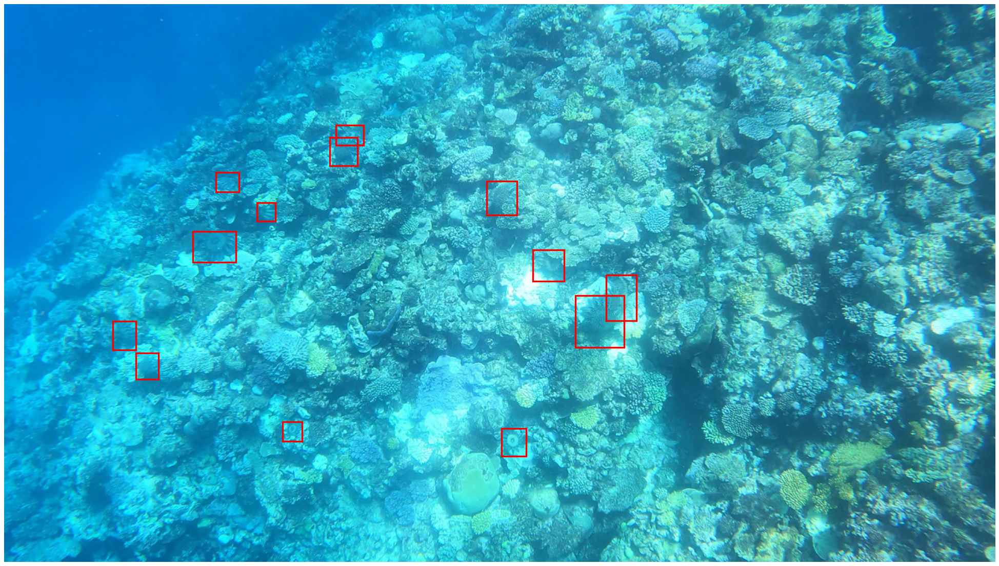

In [ ]:
img_idx = 9325
img_data = train_data.iloc[img_idx, :]
img = Image.open('//content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/train_images/video_{}/{}.jpg'.format(img_data['video_id'], img_data['video_frame']))

io = StringIO(img_data.annotations.replace("'", '"'))
annotations = json.load(io)

fig, ax = plt.subplots(figsize=(36, 18), dpi=80)
ax.imshow(img)
for annotation in annotations:
  rect = patches.Rectangle((annotation['x'], annotation['y']), annotation['width'], annotation['height'], linewidth=3, edgecolor='r', facecolor='none')
  ax.add_patch(rect)

ax.axis('off')
fig.show();

# BaseLine (YOLOR)

Usefull links:
- <a href="https://github.com/WongKinYiu/yolor">YOLOR</a> original repository
- How to train YOLOR on a custom dataset <a href="https://www.youtube.com/watch?v=sZ5DiXDOHEM">video</a>
- <a href="https://github.com/AlexeyAB/darknet/wiki">Tutorial</a> by Alexey AB
- Another <a href="https://github.com/ultralytics/yolov3/wiki/Train-Custom-Data">tutorial</a>

## Install dependencies

In [ ]:
!gdown https://drive.google.com/uc?id=1WX33ymg_XJLUJdoSf5oUYGHAtpSG2gj8

Downloading...
From: https://drive.google.com/uc?id=1WX33ymg_XJLUJdoSf5oUYGHAtpSG2gj8
To: /content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/yolor-d6.pt
100% 305M/305M [00:01<00:00, 246MB/s]


In [ ]:
%cd ..
!git clone https://github.com/WongKinYiu/yolor
%cd yolor

/content
Cloning into 'yolor'...
remote: Enumerating objects: 489, done.
remote: Total 489 (delta 0), reused 0 (delta 0), pack-reused 489
Receiving objects: 100% (489/489), 3.42 MiB | 25.97 MiB/s, done.
Resolving deltas: 100% (225/225), done.
/content/yolor


In [ ]:
!pip install -qr requirements.txt

     |████████████████████████████████| 596 kB 8.2 MB/s            
     |████████████████████████████████| 776.7 MB 4.6 kB/s             
     |████████████████████████████████| 12.7 MB 31.7 MB/s            
     |████████████████████████████████| 1.5 MB 51.3 MB/s            
  Preparing metadata (setup.py) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.7.0 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.7.0 which is incompatible.


In [ ]:
# download pretarined model
# yolor-D6
!gdown https://drive.google.com/uc?id=1WX33ymg_XJLUJdoSf5oUYGHAtpSG2gj8

# yolor-P6
!gdown https://drive.google.com/uc?id=1Tdn3yqpZ79X7R1Ql0zNlNScB1Dv9Fp76

Downloading...
From: https://drive.google.com/uc?id=1WX33ymg_XJLUJdoSf5oUYGHAtpSG2gj8
To: /content/yolor/yolor-d6.pt
100% 305M/305M [00:01<00:00, 249MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Tdn3yqpZ79X7R1Ql0zNlNScB1Dv9Fp76
To: /content/yolor/yolor_p6.pt
100% 150M/150M [00:00<00:00, 273MB/s]


In [ ]:
# install Mish-CUDA
%cd ..
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda
!python setup.py build install
%cd ..

/content
Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 195 (delta 7), reused 79 (delta 3), pack-reused 107
Receiving objects: 100% (195/195), 208.77 KiB | 11.60 MiB/s, done.
Resolving deltas: 100% (56/56), done.
/content/mish-cuda
/usr/lib/python3.7/distutils/extension.py:131: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.7
creating build/lib.linux-x86_64-3.7/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.7/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_level.txt
writing manifest file 'src/mish_c

In [ ]:
# Install PyTorch Wavelets
!git clone https://github.com/fbcotter/pytorch_wavelets
%cd pytorch_wavelets
!pip install .
%cd ..

Cloning into 'pytorch_wavelets'...
remote: Enumerating objects: 972, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 972 (delta 75), reused 89 (delta 45), pack-reused 836
Receiving objects: 100% (972/972), 6.80 MiB | 13.36 MiB/s, done.
Resolving deltas: 100% (659/659), done.
/content/pytorch_wavelets
Processing /content/pytorch_wavelets
  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-wavelets: filename=pytorch_wavelets-1.3.0-py3-none-any.whl size=54869 sha256=c3c01254edef6c13d9e7fe6d2040d9c3d3216043199b7de5f46c8d6653ea89a9
  Stored in directory: /tmp/pip-ephem-wheel-cache-0myp5jlc/wheels/ec/52/77/14db0c84c8bc8e2422c2cb0865978ec98f38c50166fcbf1590
Successfully built pytorch-wavelets
/content


## Let's detect something using the pretrained model

In [ ]:
%cd //content/yolor

/content/yolor


In [ ]:
# download some image from the Internet
!wget https://upload.wikimedia.org/wikipedia/commons/1/19/Abbey_Road_Photo_By_Sander_Lamme.jpg -O inference/images/road.jpg

--2022-01-17 12:33:21--  https://upload.wikimedia.org/wikipedia/commons/1/19/Abbey_Road_Photo_By_Sander_Lamme.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 137173 (134K) [image/jpeg]
Saving to: ‘inference/images/road.jpg’

inference/images/ro 100%[===================>] 133.96K  --.-KB/s    in 0.03s   

2022-01-17 12:33:21 (4.05 MB/s) - ‘inference/images/road.jpg’ saved [137173/137173]



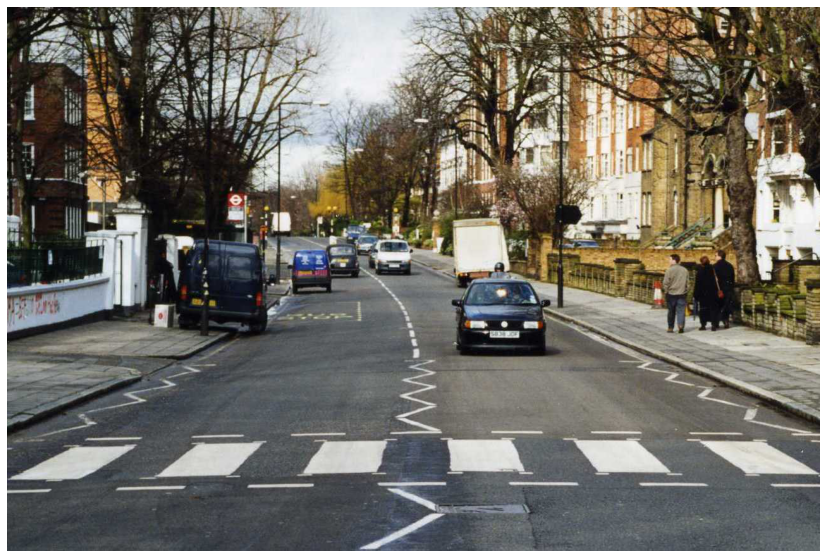

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt


img = Image.open('inference/images/road.jpg')
fig, ax = plt.subplots(figsize=(16, 10))
ax.imshow(img)
ax.axis("off")
fig.show();

In [ ]:
!python detect.py --source inference/images/road.jpg --cfg cfg/yolor_p6.cfg --weights yolor_p6.pt --conf 0.25 --img-size 1280 --device 0

Namespace(agnostic_nms=False, augment=False, cfg='cfg/yolor_p6.cfg', classes=None, conf_thres=0.25, device='0', img_size=1280, iou_thres=0.5, names='data/coco.names', output='inference/output', save_txt=False, source='inference/images/road.jpg', update=False, view_img=False, weights=['yolor_p6.pt'])
image 1/1 /content/yolor/inference/images/road.jpg: 896x1280 4 persons, 7 cars, 3 trucks, 1 traffic lights, Done. (0.043s)
Results saved to inference/output
Done. (0.191s)


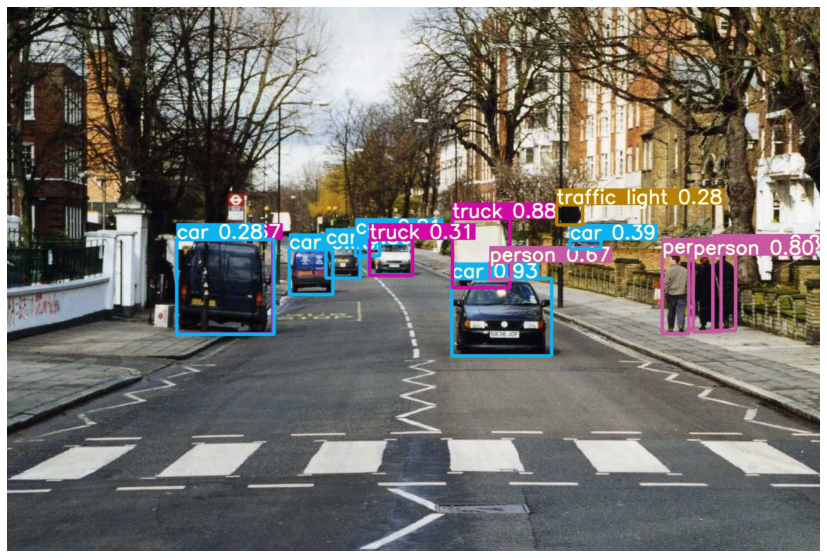

In [ ]:
img = Image.open('inference/output/road.jpg')
fig, ax = plt.subplots(figsize=(16, 10))
ax.imshow(img)
ax.axis("off")
fig.show();

In [ ]:
%cd ..

/content


## Prepare input data

In [ ]:
import os
import shutil
import json
import pandas as pd
from io import StringIO
from PIL import Image

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/train.csv', sep=",")
df["json_annotations"] = df.annotations.apply(lambda annotation: json.load(StringIO(annotation.replace("'", '"'))))
df["num_objects"] = df.json_annotations.apply(lambda lst: len(lst))

_, val_idx = train_test_split(df.index, train_size=0.9, shuffle=True, random_state=42, stratify=df.num_objects)

df['dataset'] = 'train'
df.loc[val_idx, 'dataset'] = 'val'

In [ ]:
df.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,json_annotations,num_objects,dataset
0,0,40258,0,0,0-0,[],[],0,train
1,0,40258,1,1,0-1,[],[],0,train
2,0,40258,2,2,0-2,[],[],0,train
3,0,40258,3,3,0-3,[],[],0,train
4,0,40258,4,4,0-4,[],[],0,train


In [ ]:
data_root = '//content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs'

for _, row in df.iterrows():
  images_dir = os.path.join(data_root, row.dataset, 'images')
  labels_dir = os.path.join(data_root, row.dataset, 'labels')

  if not os.path.isdir(images_dir):
    os.makedirs(images_dir)

  if not os.path.isdir(labels_dir):
    os.makedirs(labels_dir)
  
  # копируем изображения
  from_dir = os.path.join(data_root, 'train_images', f'video_{row["video_id"]}', f"{row['video_frame']}.jpg")
  to_dir = os.path.join(images_dir, f"{row['image_id']}.jpg")
  if os.path.isfile(from_dir):
    shutil.copy(from_dir, to_dir)

  # создаем файлик с аннотациями
  with Image.open(to_dir) as img:
    img_w, img_h = img.size
  label_dir = os.path.join(labels_dir, f"{row['image_id']}.txt")
  with open(label_dir, 'a') as labels:
    for bbox in row["json_annotations"]:
      x, y = (bbox.get('x') + bbox.get('width') / 2) / img_w, (bbox.get('y') + bbox.get('height') / 2) / img_h
      x, y = min(1, x), min(1, y)
      w, h = bbox.get('width') / img_w, bbox.get('height') / img_h
      label = "0 {} {} {} {}\n".format(x, y, w, h)
      labels.write(label) 

In [ ]:
%%writefile //content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/data.yaml
train: //content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/train/images
val: //content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/val/images

nc: 1
names: ['Crown-of-thorns starfish']

Writing //content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/data.yaml


## Let's check the prepared data

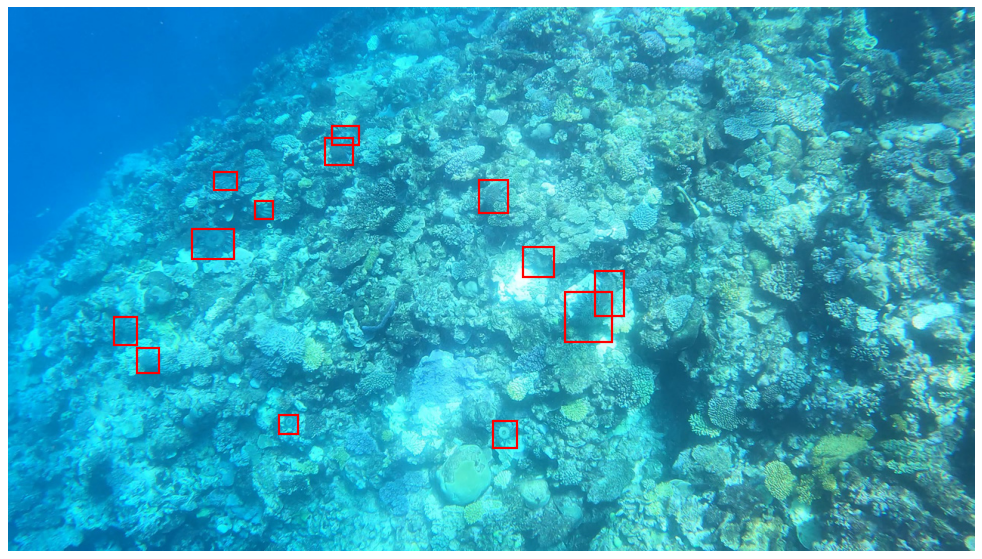

In [ ]:
row = df[df.num_objects == 13].iloc[0]
img_name = row['image_id']
dataset = row['dataset']

img = Image.open(f'//content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/{dataset}/images/{img_name}.jpg')
img_w, img_h = img.size

fig, ax = plt.subplots(figsize=(18, 9), dpi=80)
ax.imshow(img)
with open(f'/content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/{dataset}/labels/{img_name}.txt') as f:
  for annotation in f.readlines():
    x, y, w, h = list(map(float, annotation.split(' ')[1:]))
    x = (x - w / 2) * img_w
    y = (y - h / 2) * img_h
    w = w * img_w
    h = h * img_h

    rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    
ax.axis("off")
fig.show();

## Create configuration file

In [ ]:
%%writefile //content/yolor/cfg/yolor_p6_modified.cfg
[net]
batch=64
subdivisions=8
width=1280
height=1280
channels=3
momentum=0.949
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.00261
burn_in=1000
max_batches = 500500
policy=steps
steps=400000,450000
scales=.1,.1

mosaic=1


# ============ Backbone ============ #

# Stem 

# P1

# Downsample

# 0
[reorg]

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=silu


# P2

# Downsample

[convolutional]
batch_normalize=1
filters=128
size=3
stride=2
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=silu

# Residual Block

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

# Transition first
#
#[convolutional]
#batch_normalize=1
#filters=64
#size=1
#stride=1
#pad=1
#activation=silu

# Merge [-1, -(3k+3)]

[route]
layers = -1,-12

# Transition last

# 16 (previous+6+3k)
[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu


# P3

# Downsample

[convolutional]
batch_normalize=1
filters=256
size=3
stride=2
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

# Residual Block

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

# Transition first
#
#[convolutional]
#batch_normalize=1
#filters=128
#size=1
#stride=1
#pad=1
#activation=silu

# Merge [-1, -(3k+3)]

[route]
layers = -1,-24

# Transition last

# 43 (previous+6+3k)
[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu


# P4

# Downsample

[convolutional]
batch_normalize=1
filters=384
size=3
stride=2
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

# Residual Block

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

# Transition first
#
#[convolutional]
#batch_normalize=1
#filters=192
#size=1
#stride=1
#pad=1
#activation=silu

# Merge [-1, -(3k+3)]

[route]
layers = -1,-24

# Transition last

# 70 (previous+6+3k)
[convolutional]
batch_normalize=1
filters=384
size=1
stride=1
pad=1
activation=silu


# P5

# Downsample

[convolutional]
batch_normalize=1
filters=512
size=3
stride=2
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

# Residual Block

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

# Transition first
#
#[convolutional]
#batch_normalize=1
#filters=256
#size=1
#stride=1
#pad=1
#activation=silu

# Merge [-1, -(3k+3)]

[route]
layers = -1,-12

# Transition last

# 85 (previous+6+3k)
[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=silu


# P6

# Downsample

[convolutional]
batch_normalize=1
filters=640
size=3
stride=2
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

# Residual Block

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=320
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=320
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=320
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

# Transition first
#
#[convolutional]
#batch_normalize=1
#filters=320
#size=1
#stride=1
#pad=1
#activation=silu

# Merge [-1, -(3k+3)]

[route]
layers = -1,-12

# Transition last

# 100 (previous+6+3k)
[convolutional]
batch_normalize=1
filters=640
size=1
stride=1
pad=1
activation=silu

# ============ End of Backbone ============ #

# ============ Neck ============ #

# CSPSPP

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=320
activation=silu

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

### SPP ###
[maxpool]
stride=1
size=5

[route]
layers=-2

[maxpool]
stride=1
size=9

[route]
layers=-4

[maxpool]
stride=1
size=13

[route]
layers=-1,-3,-5,-6
### End SPP ###

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=320
activation=silu

[route]
layers = -1, -13

# 115 (previous+6+5+2k)
[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

# End of CSPSPP


# FPN-5

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[upsample]
stride=2

[route]
layers = 85

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[route]
layers = -1, -3

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

# Plain Block

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=silu

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=silu

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=silu

# Merge [-1, -(2k+2)]

[route]
layers = -1, -8

# Transition last

# 131 (previous+6+4+2k)
[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu


# FPN-4

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[upsample]
stride=2

[route]
layers = 70

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[route]
layers = -1, -3

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

# Plain Block

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=192
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=192
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=192
activation=silu

# Merge [-1, -(2k+2)]

[route]
layers = -1, -8

# Transition last

# 147 (previous+6+4+2k)
[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu


# FPN-3

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[upsample]
stride=2

[route]
layers = 43

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[route]
layers = -1, -3

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

# Plain Block

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=128
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=128
activation=silu

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=128
activation=silu

# Merge [-1, -(2k+2)]

[route]
layers = -1, -8

# Transition last

# 163 (previous+6+4+2k)
[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=silu


# PAN-4

[convolutional]
batch_normalize=1
size=3
stride=2
pad=1
filters=192
activation=silu

[route]
layers = -1, 147

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

# Plain Block

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=192
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=192
activation=silu

[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=192
activation=silu

[route]
layers = -1,-8

# Transition last

# 176 (previous+3+4+2k)
[convolutional]
batch_normalize=1
filters=192
size=1
stride=1
pad=1
activation=silu


# PAN-5

[convolutional]
batch_normalize=1
size=3
stride=2
pad=1
filters=256
activation=silu

[route]
layers = -1, 131

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

# Plain Block

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=silu

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=silu

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=silu

[route]
layers = -1,-8

# Transition last

# 189 (previous+3+4+2k)
[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=silu


# PAN-6

[convolutional]
batch_normalize=1
size=3
stride=2
pad=1
filters=320
activation=silu

[route]
layers = -1, 115

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

# Plain Block

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=320
activation=silu

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=320
activation=silu

[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=320
activation=silu

[route]
layers = -1,-8

# Transition last

# 202 (previous+3+4+2k)
[convolutional]
batch_normalize=1
filters=320
size=1
stride=1
pad=1
activation=silu

# ============ End of Neck ============ #

# 203
[implicit_add]
filters=256

# 204
[implicit_add]
filters=384

# 205
[implicit_add]
filters=512

# 206
[implicit_add]
filters=640

# 207
[implicit_mul]
filters=18

# 208
[implicit_mul]
filters=18

# 209
[implicit_mul]
filters=18

# 210
[implicit_mul]
filters=18

# ============ Head ============ #

# YOLO-3

[route]
layers = 163

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=silu

[shift_channels]
from=203

[convolutional]
size=1
stride=1
pad=1
filters=18
activation=linear

[control_channels]
from=207

[yolo]
mask = 0,1,2
anchors = 19,27,  44,40,  38,94,  96,68,  86,152,  180,137,  140,301,  303,264,  238,542,  436,615,  739,380,  925,792
classes=1
num=12
jitter=.3
ignore_thresh = .7
truth_thresh = 1
random=1
scale_x_y = 1.05
iou_thresh=0.213
cls_normalizer=1.0
iou_normalizer=0.07
iou_loss=ciou
nms_kind=greedynms
beta_nms=0.6


# YOLO-4

[route]
layers = 176

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=384
activation=silu

[shift_channels]
from=204

[convolutional]
size=1
stride=1
pad=1
filters=18
activation=linear

[control_channels]
from=208

[yolo]
mask = 3,4,5
anchors = 19,27,  44,40,  38,94,  96,68,  86,152,  180,137,  140,301,  303,264,  238,542,  436,615,  739,380,  925,792
classes=1
num=12
jitter=.3
ignore_thresh = .7
truth_thresh = 1
random=1
scale_x_y = 1.05
iou_thresh=0.213
cls_normalizer=1.0
iou_normalizer=0.07
iou_loss=ciou
nms_kind=greedynms
beta_nms=0.6


# YOLO-5

[route]
layers = 189

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=512
activation=silu

[shift_channels]
from=205

[convolutional]
size=1
stride=1
pad=1
filters=18
activation=linear

[control_channels]
from=209

[yolo]
mask = 6,7,8
anchors = 19,27,  44,40,  38,94,  96,68,  86,152,  180,137,  140,301,  303,264,  238,542,  436,615,  739,380,  925,792
classes=1
num=12
jitter=.3
ignore_thresh = .7
truth_thresh = 1
random=1
scale_x_y = 1.05
iou_thresh=0.213
cls_normalizer=1.0
iou_normalizer=0.07
iou_loss=ciou
nms_kind=greedynms
beta_nms=0.6


# YOLO-6

[route]
layers = 202

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=640
activation=silu

[shift_channels]
from=206

[convolutional]
size=1
stride=1
pad=1
filters=18
activation=linear

[control_channels]
from=210

[yolo]
mask = 9,10,11
anchors = 19,27,  44,40,  38,94,  96,68,  86,152,  180,137,  140,301,  303,264,  238,542,  436,615,  739,380,  925,792
classes=1
num=12
jitter=.3
ignore_thresh = .7
truth_thresh = 1
random=1
scale_x_y = 1.05
iou_thresh=0.213
cls_normalizer=1.0
iou_normalizer=0.07
iou_loss=ciou
nms_kind=greedynms
beta_nms=0.6

# ============ End of Head ============ #

Writing //content/yolor/cfg/yolor_p6_modified.cfg


In [ ]:
!cat //content/yolor/cfg/yolor_p6_modified.cfg

[net]
batch=64
subdivisions=8
width=1280
height=1280
channels=3
momentum=0.949
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.00261
burn_in=1000
max_batches = 500500
policy=steps
steps=400000,450000
scales=.1,.1

mosaic=1


# ============ Backbone ============ #

# Stem 

# P1

# Downsample

# 0
[reorg]

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=silu


# P2

# Downsample

[convolutional]
batch_normalize=1
filters=128
size=3
stride=2
pad=1
activation=silu

# Split

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=silu

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=silu

# Residual Block

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=silu

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=silu

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=64
size=1


## Train the model

In [ ]:
%cd //content/yolor
!python train.py \
  --batch-size 8 \
  --img-size 1280 720 \
  --data '//content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/data.yaml' \
  --cfg '//content/yolor/cfg/yolor_p6_modified.cfg' \
  --weights '//content/MyDrive/MyDrive/kaggle/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/runs/train/yolor_p6_starfish_detector/weights/last.pt' \
  --device 0 \
  --name yolor_p6_starfish_detector \
  --hyp '/content/yolor/data/hyp.scratch.1280.yaml' \
  --project '//content/MyDrive/MyDrive/kaggle/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/runs/train' \
  --epochs 300

/content/yolor
Using torch 1.7.0 CUDA:0 (Tesla P100-PCIE-16GB, 16280MB)

Namespace(adam=False, batch_size=8, bucket='', cache_images=False, cfg='//content/yolor/cfg/yolor_p6_modified.cfg', data='//content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/data.yaml', device='0', epochs=300, evolve=False, exist_ok=False, global_rank=-1, hyp='/content/yolor/data/hyp.scratch.1280.yaml', image_weights=False, img_size=[1280, 720], local_rank=-1, log_imgs=16, multi_scale=False, name='yolor_p6_starfish_detector', noautoanchor=False, nosave=False, notest=False, project='//content/MyDrive/MyDrive/kaggle/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/runs/train', rect=False, resume=False, save_dir='//content/MyDrive/MyDrive/kaggle/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/runs/train/yolor_p6_starfish_detector2', single_cls=False, sync_bn=False, total_batch_size=8, weights='//content/MyDrive/MyDrive/kaggle/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/runs/train/yolor_p6_starfish

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

## Let's have a look on results

In [ ]:
%cd //content/yolor

/content/yolor


In [ ]:
%%writefile //content/yolor/data/data.names
Crown-of-thorns starfish

Overwriting //content/yolor/data/data.names


In [ ]:
!python detect.py \
  --source '//content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/train/images/1-4173.jpg' \
  --names 'data/data.names' \
  --cfg 'cfg/yolor_p6_modified.cfg' \
  --weights '//content/MyDrive/MyDrive/kaggle/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/runs/train/yolor_p6_starfish_detector/weights/last.pt' \
  --conf 0.25 \
  --img-size 1280 \
  --device 0

Namespace(agnostic_nms=False, augment=False, cfg='cfg/yolor_p6_modified.cfg', classes=None, conf_thres=0.25, device='0', img_size=1280, iou_thres=0.5, names='data/data.names', output='inference/output', save_txt=False, source='//content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/train/images/1-4173.jpg', update=False, view_img=False, weights=['//content/MyDrive/MyDrive/kaggle/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/runs/train/yolor_p6_starfish_detector/weights/last.pt'])
image 1/1 //content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/train/images/1-4173.jpg: 768x1280 13 Crown-of-thorns starfishs, Done. (0.041s)
Results saved to inference/output
Done. (0.152s)


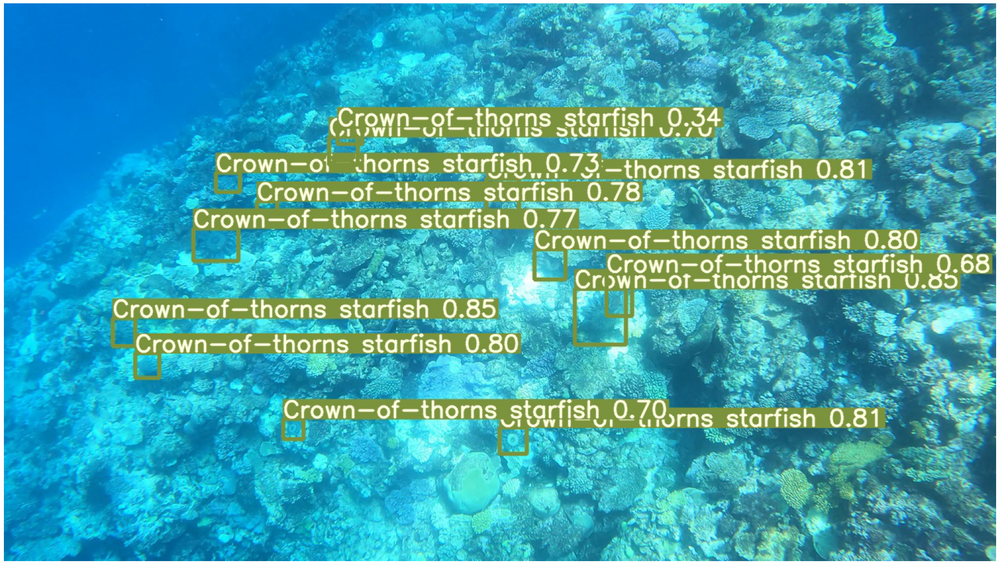

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image


img = Image.open("/content/yolor/inference/output/1-4173.jpg")
fig, ax = plt.subplots(1, 1, figsize=(32, 25))
ax.imshow(img)
ax.axis("off");

# Tries to improve my BaseLine

In [ ]:
import pandas as pd
from io import StringIO
import json

import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
def prepare_annotations(wet_annotation, img_width=1280, img_height=720):
  json_annotation = json.load(StringIO(wet_annotation.replace("'", '"')))
  final_annotation = list()
  for bbox in json_annotation:
    x, y = (bbox.get('x') + bbox.get('width') / 2) / img_width, (bbox.get('y') + bbox.get('height') / 2) / img_height
    x, y = min(1, x), min(1, y)
    w, h = bbox.get('width') / img_width, bbox.get('height') / img_height
    final_annotation.append({'x': x, 'y': y, 'w': w, 'h': h})
  return final_annotation


# Посмотрим на то, как распределены наши данные
df = pd.read_csv('/content/TensorFlow_-_Help_Protect_the_Great_Barrier_Reef/inputs/train.csv', sep=",")
df["prepared_annotations"] = df.annotations.apply(prepare_annotations)
df["num_objects"] = df.prepared_annotations.apply(lambda lst: len(lst))

x_values, y_values, w_values, h_values = list(), list(), list(), list()
for annotations in df.prepared_annotations:
  for annotation in annotations:
    x_values.append(annotation.get("x"))
    y_values.append(annotation.get("y"))
    w_values.append(annotation.get("w"))
    h_values.append(annotation.get("h"))

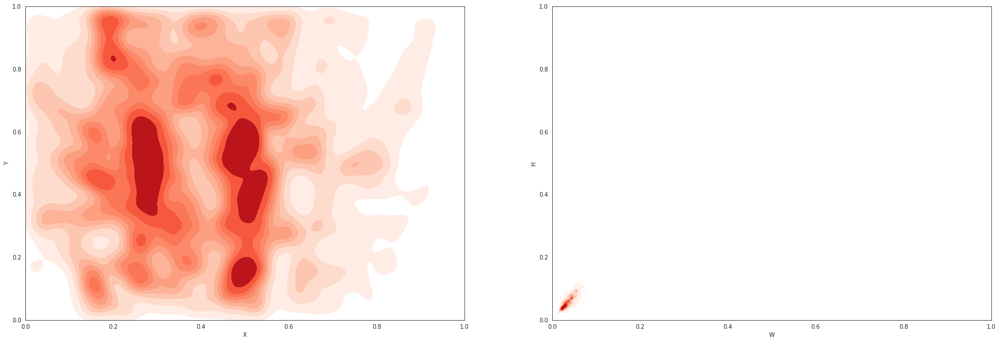

In [ ]:
sns.set_style("white")

fig, ax = plt.subplots(1, 2, figsize=(30, 10))
sns.kdeplot(ax=ax[0], x=x_values, y=y_values, cmap="Reds", shade=True, bw_adjust=.5)
sns.kdeplot(ax=ax[1], x=w_values, y=h_values, cmap="Reds", shade=True, bw_adjust=.5)

ax[0].set(xlabel="X", ylabel="Y", xlim=(0, 1), ylim=(0, 1))
ax[1].set(xlabel="W", ylabel="H", xlim=(0, 1), ylim=(0, 1))
plt.show();